# Plotting example for Boston 311 data

In this notebook we plot Boston's 311 data onto a map of Boston.

Data via https://data.boston.gov/dataset/311-service-requests

## Setup

First, be sure to run notebook **`R environment setup`** in this workspace.

Then in this section we:

1. install a few additional R packages
2. load the needed R packages

In [1]:
list.of.packages <- c("ggplot2", "lme4", "data.table", "fitdistrplus", "data.table", 
                      "speedglm", "hexbin", "poweRlaw", "splines", "statmod", "bit64", "RCurl",
                     "httr")
new.packages <- list.of.packages[!(list.of.packages %in% installed.packages()[,"Package"])]
if(length(new.packages)) install.packages(new.packages,repos = "http://cran.us.r-project.org")

In [2]:
library(ggplot2)
library(data.table)
library(lme4)
library(fitdistrplus)
library(poweRlaw)
library(speedglm)
library(splines)
library(statmod)
library(RCurl)
library(httr)

Loading required package: Matrix

Loading required package: MASS

Loading required package: survival

Loading required package: npsurv

Loading required package: lsei

Loading required package: bitops



In [3]:
options(repr.plot.height = 14, repr.plot.width = 14)
theme_set(theme_gray(base_size = 18))

# Download data

In [4]:
# Data comes via a link from https://data.boston.gov/dataset/311-service-requests
# It yields a 403 error but that page with the 403 also provides you with a resolved URL that 
# contains a session token to download the raw data. By parsing the header, you can extract that 
# resolved URL.
lookup <- HEAD("https://data.boston.gov/dataset/8048697b-ad64-4bfc-b090-ee00169f2323/resource/2be28d90-3a90-4af1-a3f6-f28c1e25880a/download/311_service_requests_2018.csv")
resolved_url <- ((lookup$all_headers[[1]])$headers)$location

In [5]:
# Note: This will give a warning about integer overflow. This is to be expected.
download <- getURL(resolved_url)

In [6]:
dat <- fread(text=download, 
            sep=",",
            header=TRUE,
            quote="\"",
            data.table=FALSE,
            check.names=TRUE)

In [7]:
str(dat)

'data.frame':	263105 obs. of  29 variables:
 $ case_enquiry_id               :integer64 101002296861 101002296862 101002296864 101002296865 101002296866 101002296868 101002296869 101002296870 ... 
 $ open_dt                       : chr  "2018-01-01 00:08:00" "2018-01-01 00:09:46" "2018-01-01 00:11:24" "2018-01-01 00:19:06" ...
 $ target_dt                     : chr  "" "2018-01-02 08:30:00" "2018-01-02 08:30:00" "2018-01-02 08:30:00" ...
 $ closed_dt                     : chr  "2018-03-01 15:18:12" "2018-01-02 21:15:22" "2018-01-02 21:15:11" "2018-01-02 21:14:48" ...
 $ ontime                        : chr  "ONTIME" "OVERDUE" "OVERDUE" "OVERDUE" ...
 $ case_status                   : chr  "Closed" "Closed" "Closed" "Closed" ...
 $ closure_reason                : chr  "Case Closed. Closed date : 2018-03-01 15:18:12.42 Case Resolved REPAIRED HYDRANT 2/26" "Case Closed. Closed date : 2018-01-02 21:15:22.323 Duplicate of Existing Case" "Case Closed. Closed date : 2018-01-02 21:15:11.62 Case

In [8]:
head(dat)

case_enquiry_id,open_dt,target_dt,closed_dt,ontime,case_status,closure_reason,case_title,subject,reason,⋯,police_district,neighborhood,neighborhood_services_district,ward,precinct,location_street_name,location_zipcode,latitude,longitude,source
<int64>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>
101002296861,2018-01-01 00:08:00,,2018-03-01 15:18:12,ONTIME,Closed,Case Closed. Closed date : 2018-03-01 15:18:12.42 Case Resolved REPAIRED HYDRANT 2/26,Fire Hydrant,Boston Water & Sewer Commission,Fire Hydrant,⋯,E13,Jamaica Plain,11,Ward 19,1903,413 Centre St,2130,42.3214,-71.1109,Constituent Call
101002296862,2018-01-01 00:09:46,2018-01-02 08:30:00,2018-01-02 21:15:22,OVERDUE,Closed,Case Closed. Closed date : 2018-01-02 21:15:22.323 Duplicate of Existing Case,Parking Enforcement,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,⋯,C6,South Boston / South Boston Waterfront,5,Ward 6,0604,428 W Second St,2127,42.3373,-71.0445,Citizens Connect App
101002296864,2018-01-01 00:11:24,2018-01-02 08:30:00,2018-01-02 21:15:11,OVERDUE,Closed,Case Closed. Closed date : 2018-01-02 21:15:11.62 Case Noted clear,Parking Enforcement,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,⋯,C6,South Boston / South Boston Waterfront,5,Ward 6,0604,401-403 W Second St,2127,42.3371,-71.0442,Citizens Connect App
101002296865,2018-01-01 00:19:06,2018-01-02 08:30:00,2018-01-02 21:14:48,OVERDUE,Closed,Case Closed. Closed date : 2018-01-02 21:14:48.407 Duplicate of Existing Case,Parking Enforcement,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,⋯,B3,Dorchester,9,17,1701,INTERSECTION School St & Washington St,NA,42.3594,-71.0587,Citizens Connect App
101002296866,2018-01-01 00:21:25,2018-01-02 08:30:00,2018-01-02 21:14:32,OVERDUE,Closed,Case Closed. Closed date : 2018-01-02 21:14:32.94 Duplicate of Existing Case,Parking Enforcement,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,⋯,B3,Dorchester,9,Ward 17,1701,6-8 School St,2124,42.2965,-71.0729,Citizens Connect App
101002296868,2018-01-01 00:51:00,,2018-01-01 13:18:04,ONTIME,Closed,Case Closed. Closed date : 2018-01-01 13:18:04.193 Case Resolved caller canceled found owner,Animal Found,Animal Control,Animal Issues,⋯,B3,Dorchester,9,Ward 17,1701,22-24 Thane St,2124,42.2967,-71.0764,Constituent Call


In [9]:
length(dat[,1])

[1] 263105

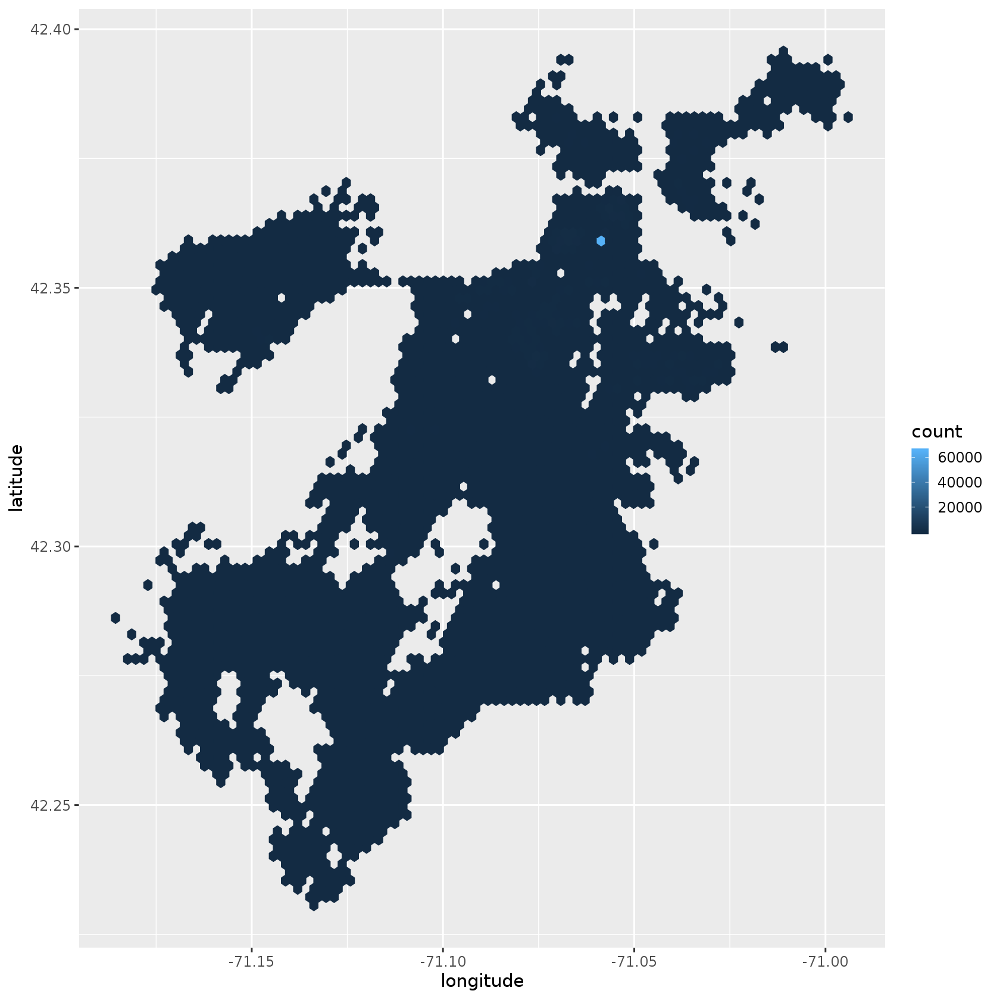

In [10]:
ggplot(dat) +
geom_hex(aes(longitude, latitude, col=..count..), 
        bins=90)

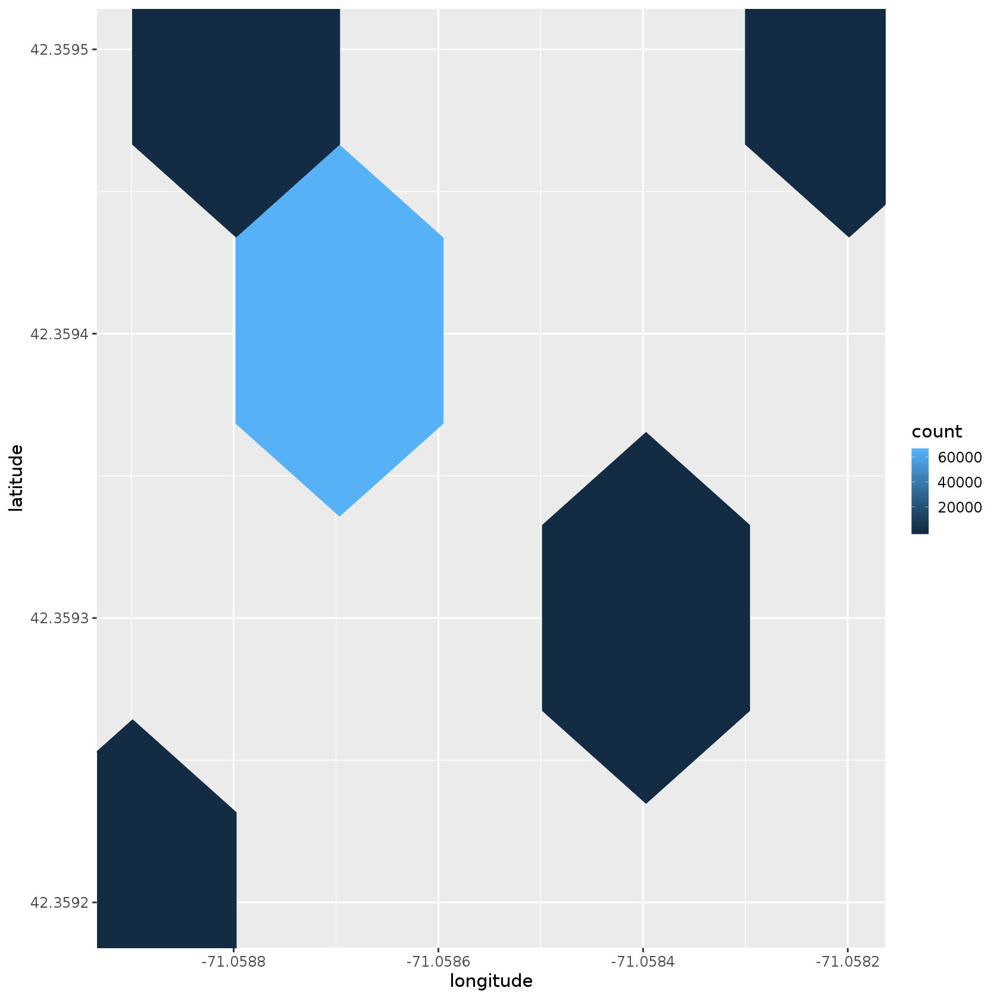

In [11]:
ggplot(dat[dat$longitude < -71.058 & dat$longitude > -71.059 & dat$latitude < 42.36 & dat$latitude > 42.359,]) +
geom_hex(aes(longitude, latitude, col=..count..), 
        bins=90)

In [12]:
length(dat[dat$latitude==42.3594 & dat$longitude==-71.0587,1])

[1] 65192

It looks like any report without GPS coordinates gets assigned to City Hall.

Let's remove City Hall and see how the report density actually varies:

In [13]:
notCityHall <- dat[!(dat$latitude==42.3594 & dat$longitude==-71.0587),]

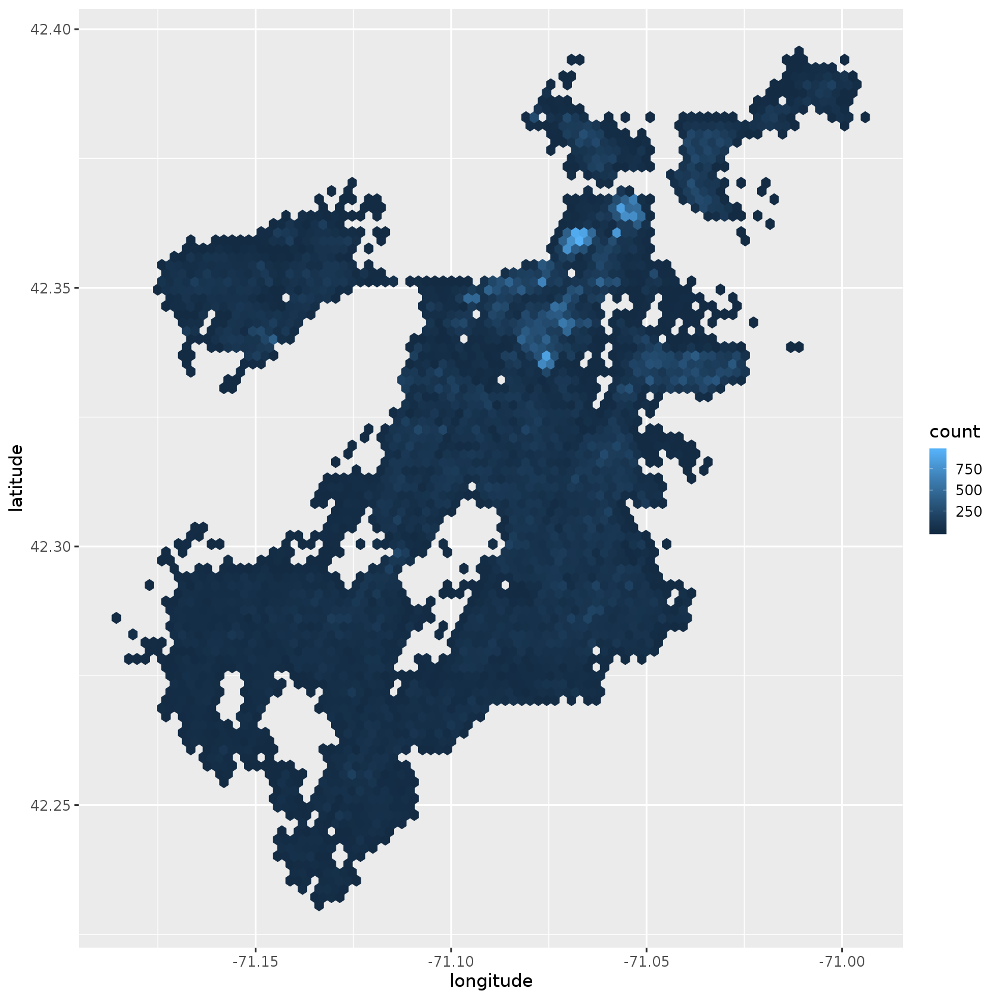

In [14]:
p0 <- ggplot(notCityHall) +
geom_hex(aes(longitude, latitude, col=..count..), 
        bins=90)

print(p0)

# Needle pickup requests

In [15]:
needleCases <- notCityHall[grep("Needle", notCityHall$case_title), ]

In [16]:
length(needleCases[,1])

[1] 3382

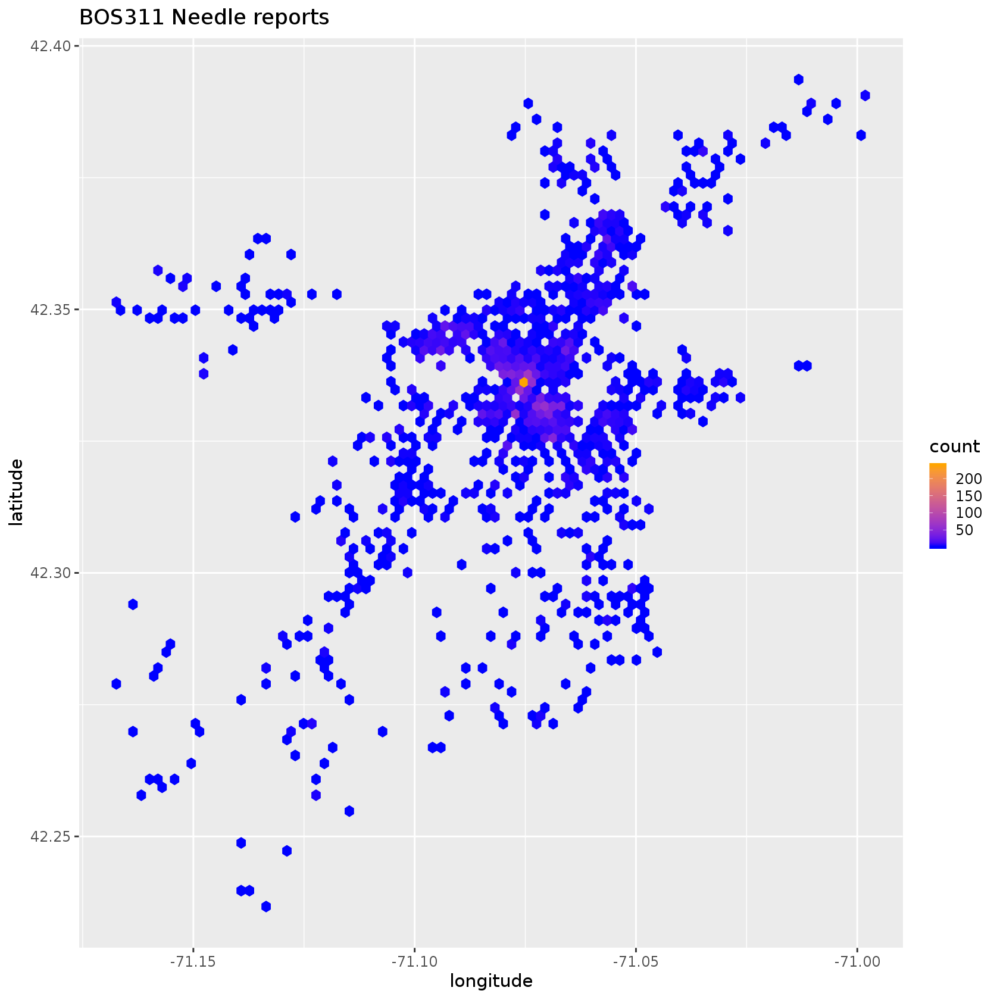

In [17]:
p <- ggplot(needleCases) +
geom_hex(aes(longitude, latitude, col=..count..), 
        bins=90) + 
scale_colour_gradient(low = "blue", high = "orange") +
scale_fill_gradient(low = "blue", high = "orange") +
ggtitle("BOS311 Needle reports")
print(p)

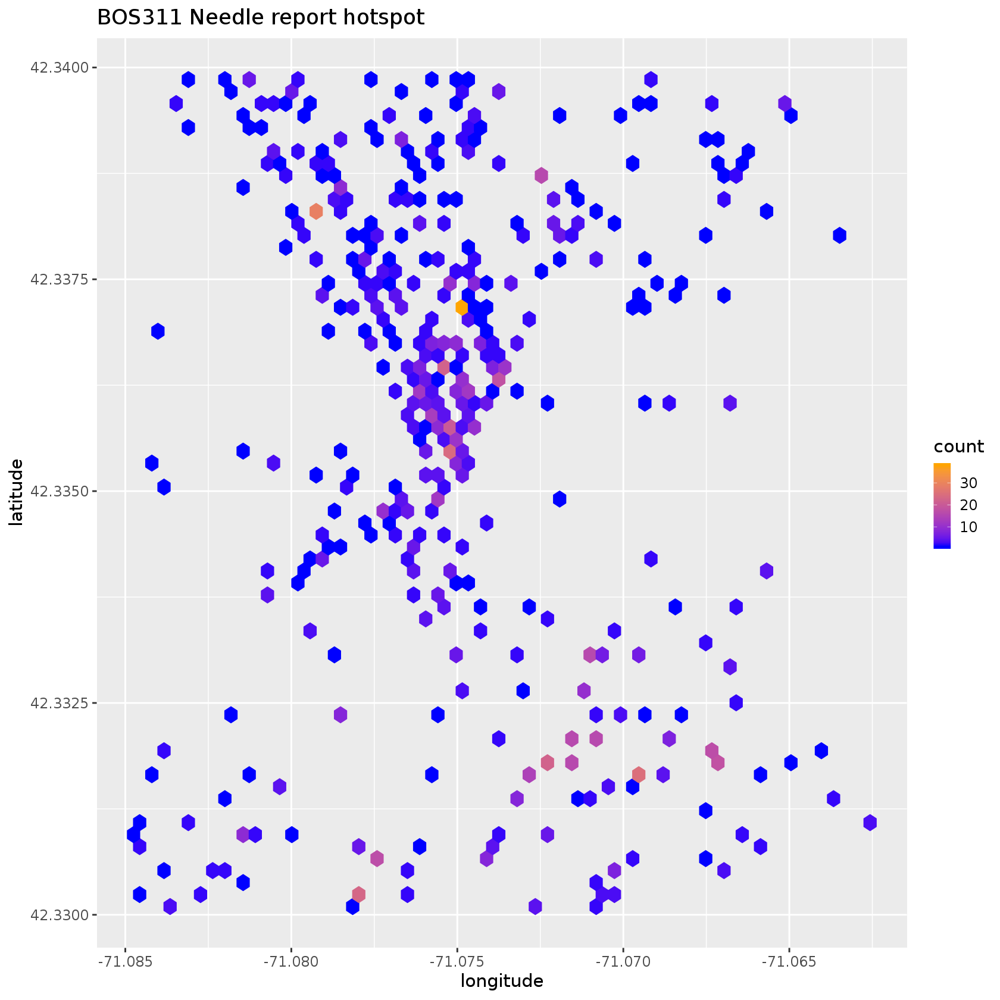

In [18]:
ggplot(needleCases[with(needleCases, latitude>42.33 & latitude < 42.34 & longitude > -71.085 & longitude < -71.06),]) +
geom_hex(aes(longitude, latitude, col=..count..), 
        bins=60) + 
scale_colour_gradient(low = "blue", high = "orange") +
scale_fill_gradient(low = "blue", high = "orange") +
ggtitle("BOS311 Needle report hotspot")

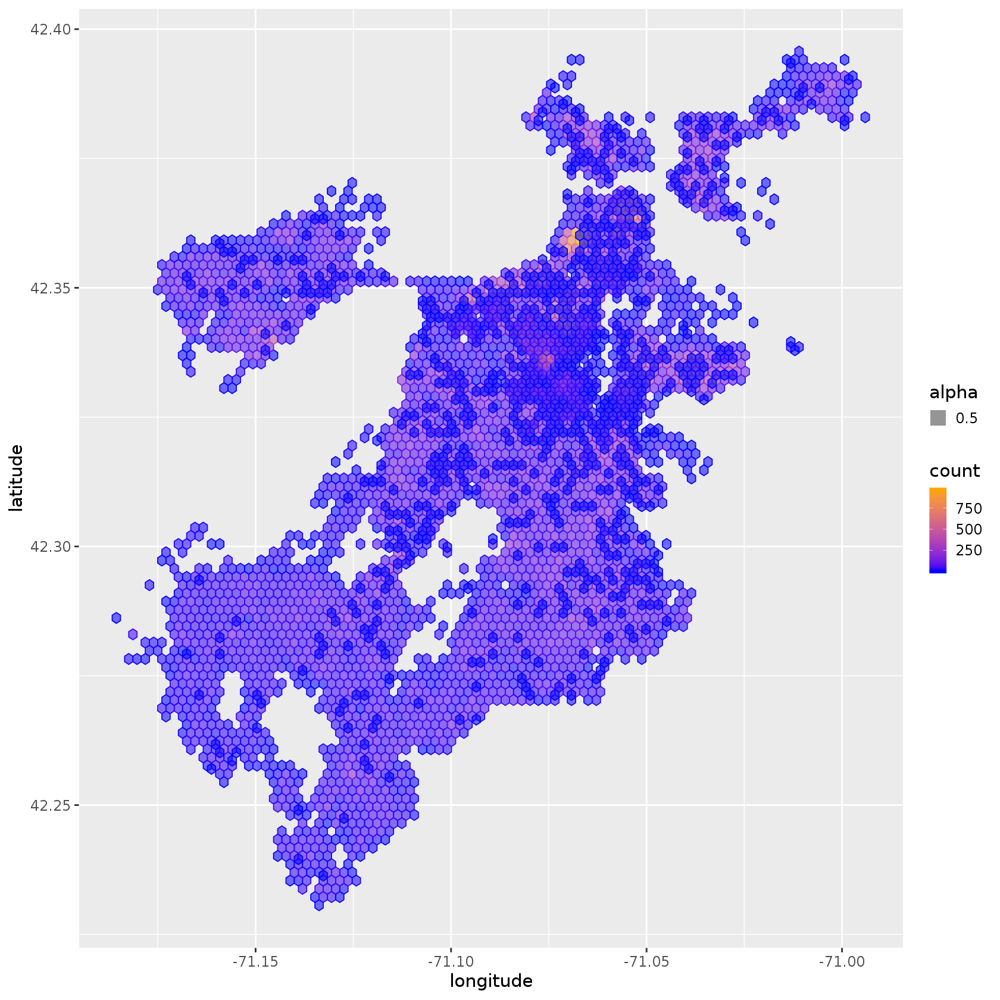

In [19]:
# Note: this is a failed overlay of the generic request density map and the needle pickup map
print(ggplot(notCityHall) + geom_hex(aes(longitude, latitude, alpha=0.5, col=..count..), bins=90) +
      geom_hex(data=needleCases, aes(longitude, latitude, alpha=0.5, col=..count..), bins=90) +
      scale_colour_gradient(low = "blue", high = "orange") +
      scale_fill_gradient(low = "blue", high = "orange"))

# What else can we plot?

In [20]:
ct <- as.data.frame(xtabs(~type, data=notCityHall))
ct[order(-ct$Freq),]

,type,Freq
,<fct>,<int>
92,Parking Enforcement,29091
70,Missed Trash/Recycling/Yard Waste/Bulk Item,13853
123,Requests for Street Cleaning,13380
57,Improper Storage of Trash (Barrels),12667
130,Schedule a Bulk Item Pickup,10503
118,Request for Pothole Repair,10247
22,CE Collection,7714
105,Poor Conditions of Property,5467
144,Street Light Outages,5220


In [21]:
plotBOS <- function(df, case_title) {
        p <- ggplot(notCityHall[grep(case_title, notCityHall$case_title), ]) +
    geom_hex(aes(longitude, latitude, col=..count..), 
            bins=90) + 
    scale_colour_gradient(low = "blue", high = "orange") +
    scale_fill_gradient(low = "blue", high = "orange") +
    ggtitle(case_title)
    print(p)
}

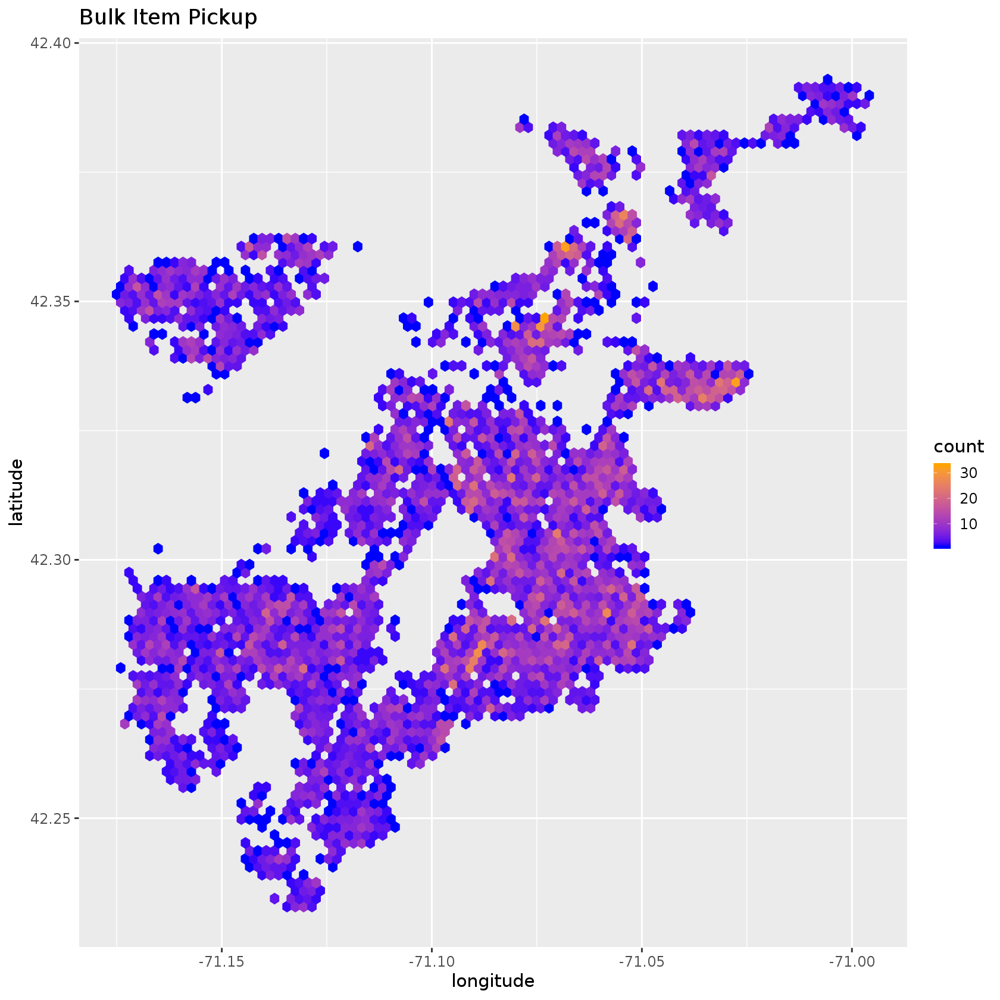

In [22]:
plotBOS(notCityHall, "Bulk Item Pickup")

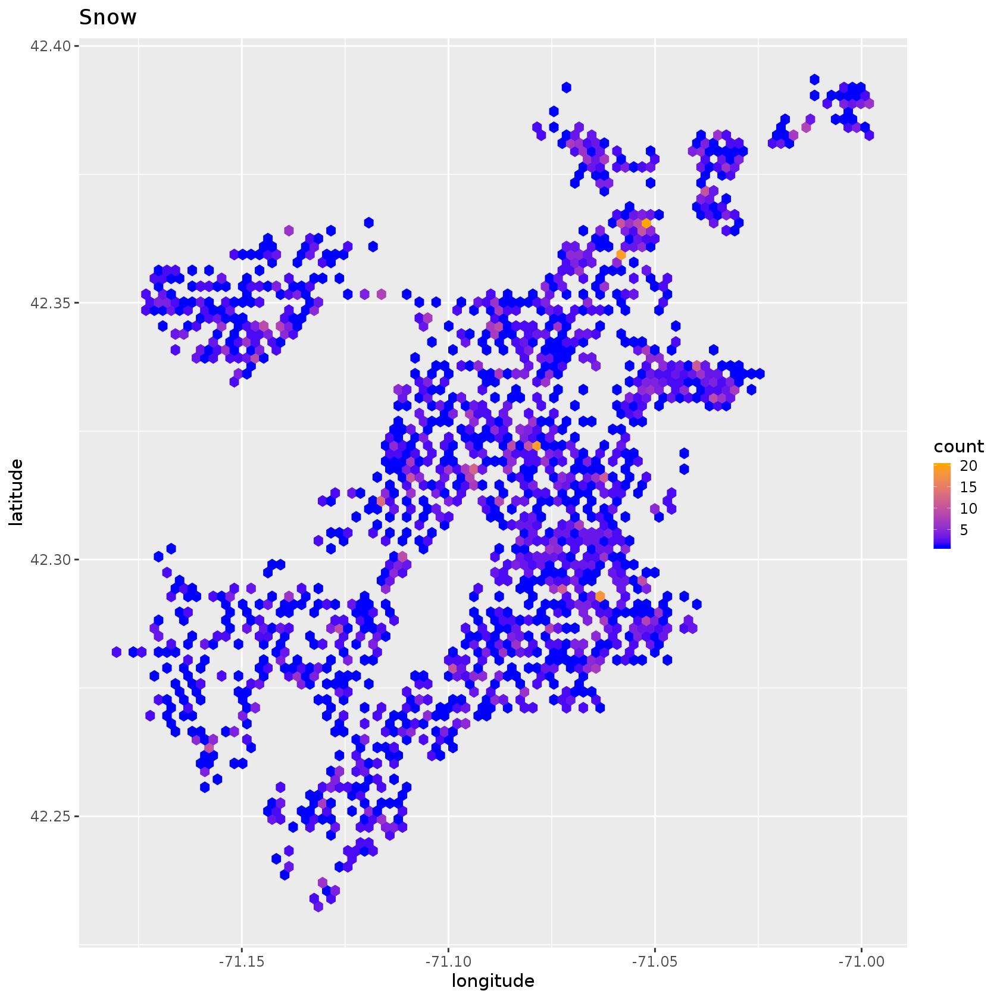

In [23]:
plotBOS(notCityHall, "Snow")

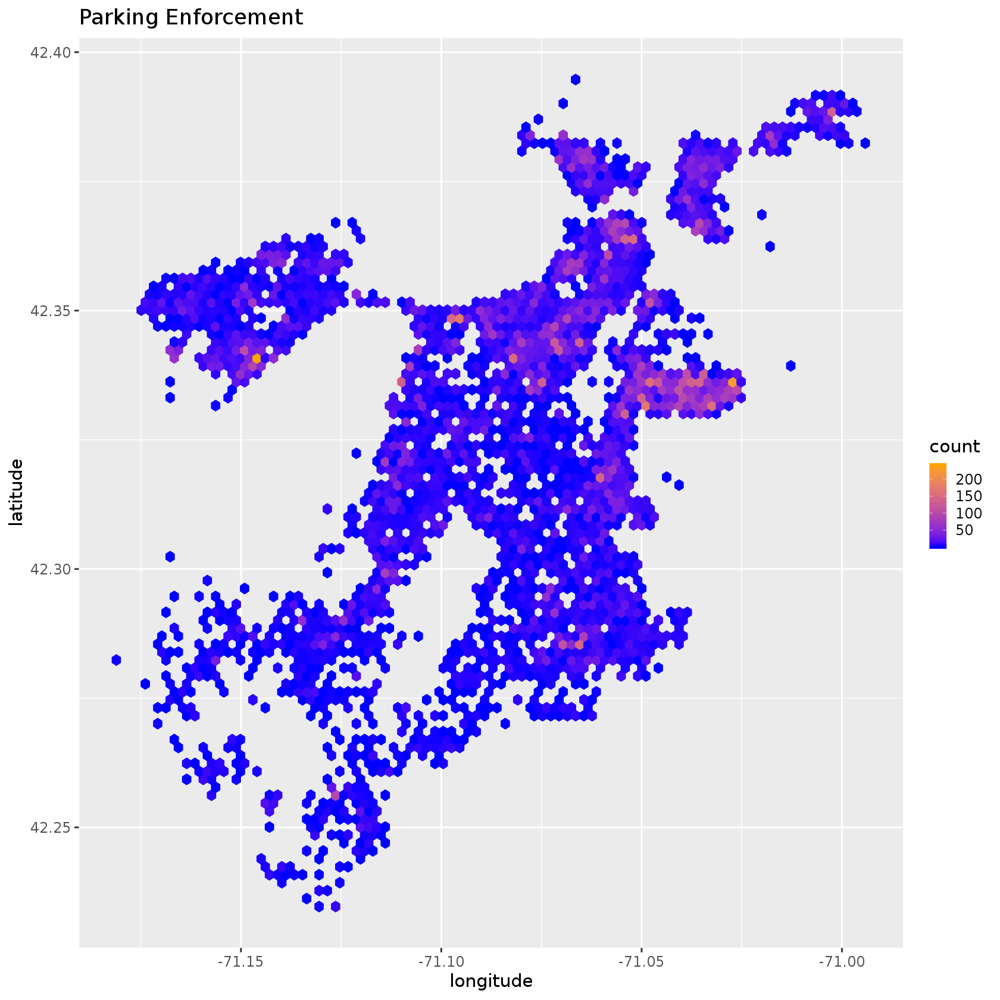

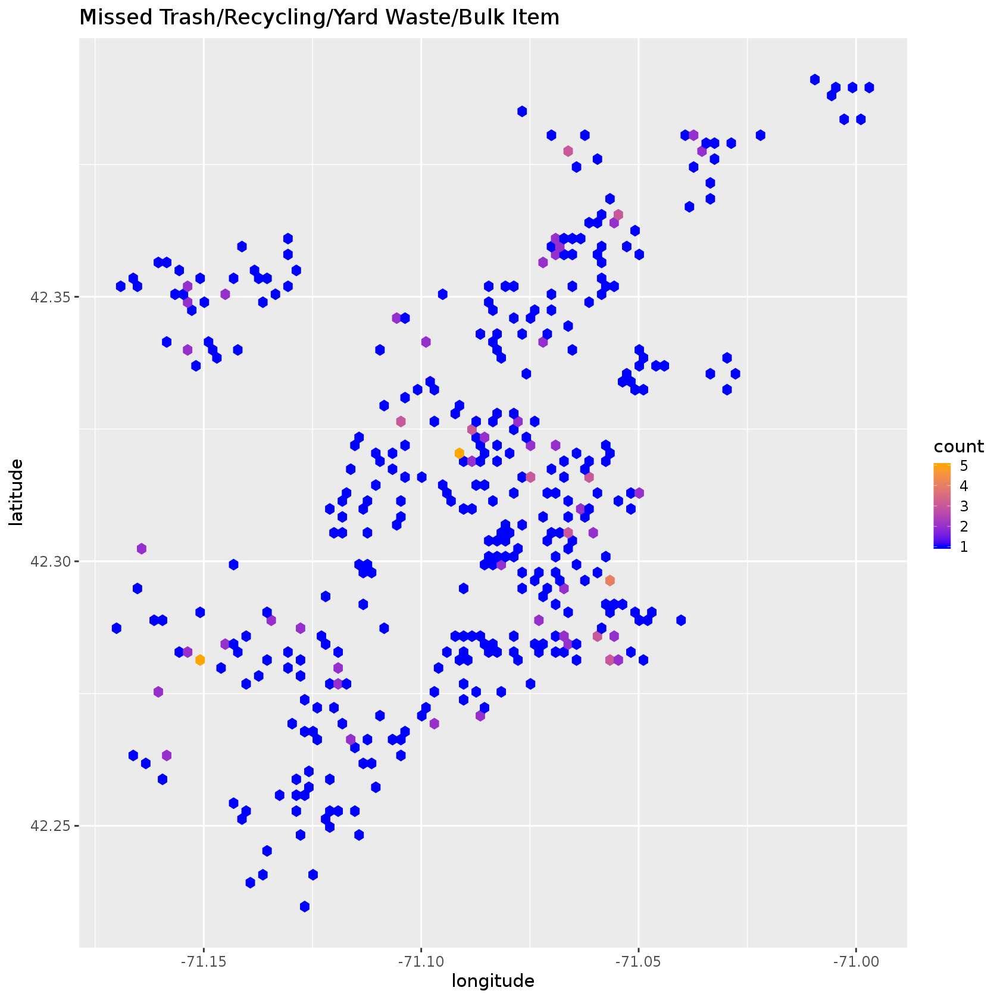

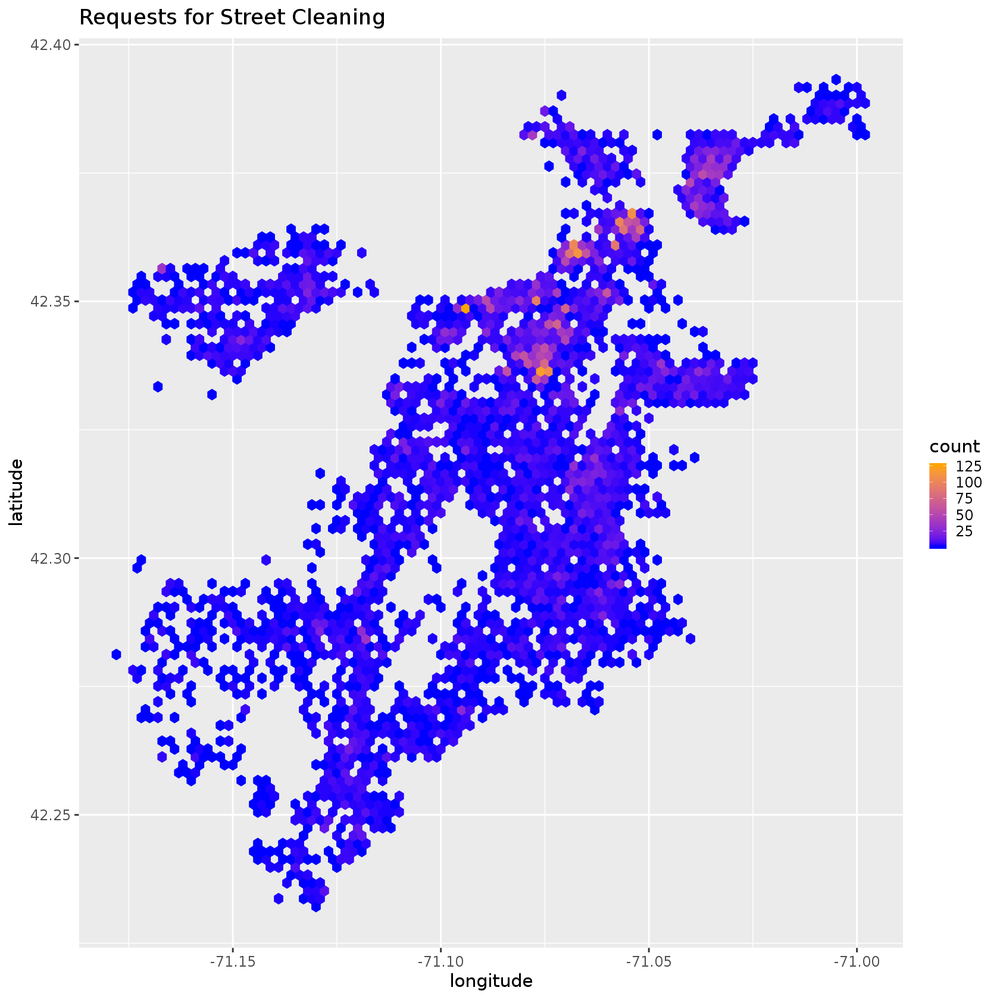

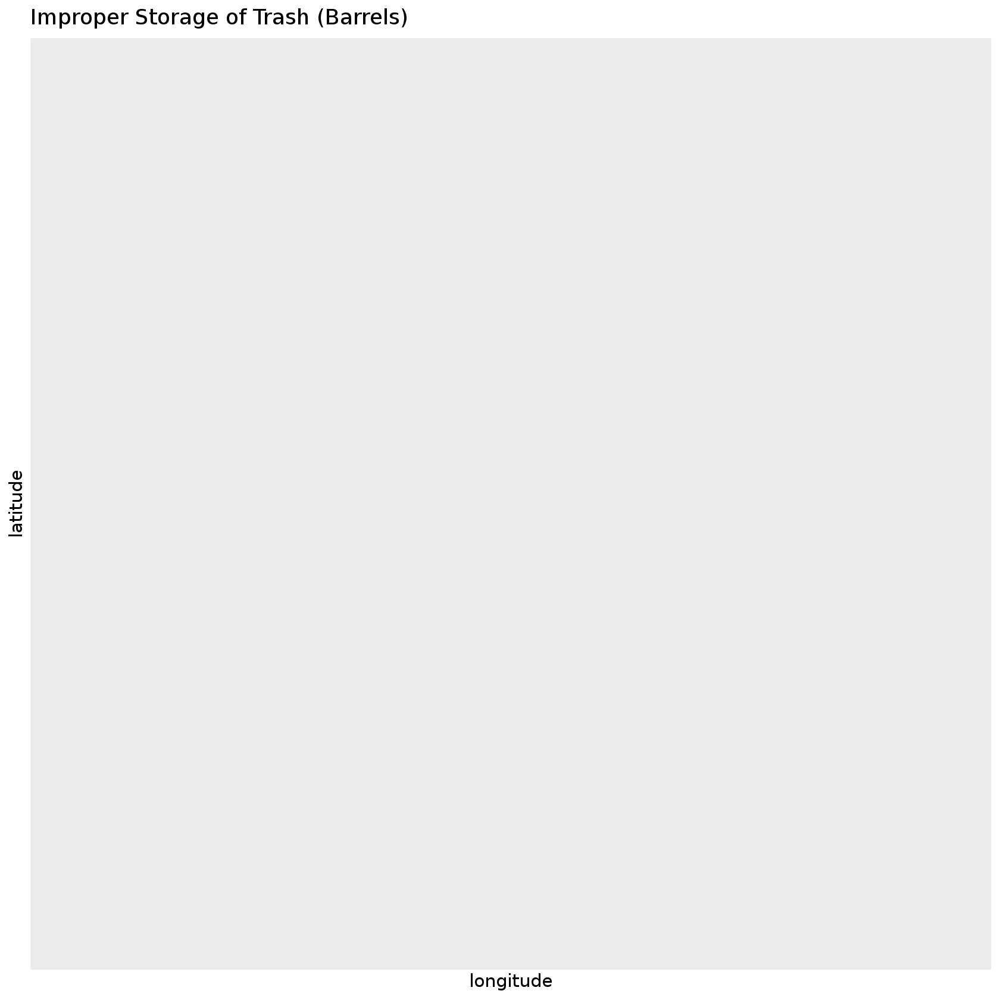

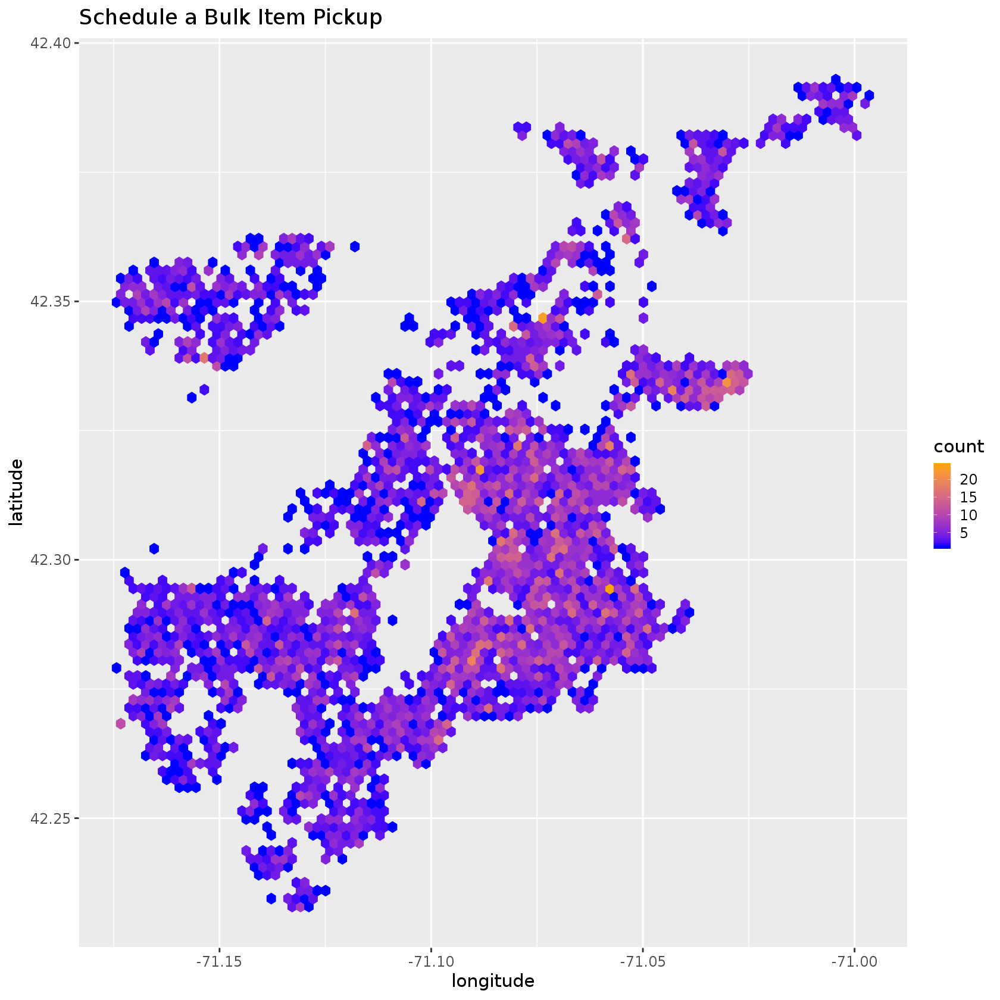

...

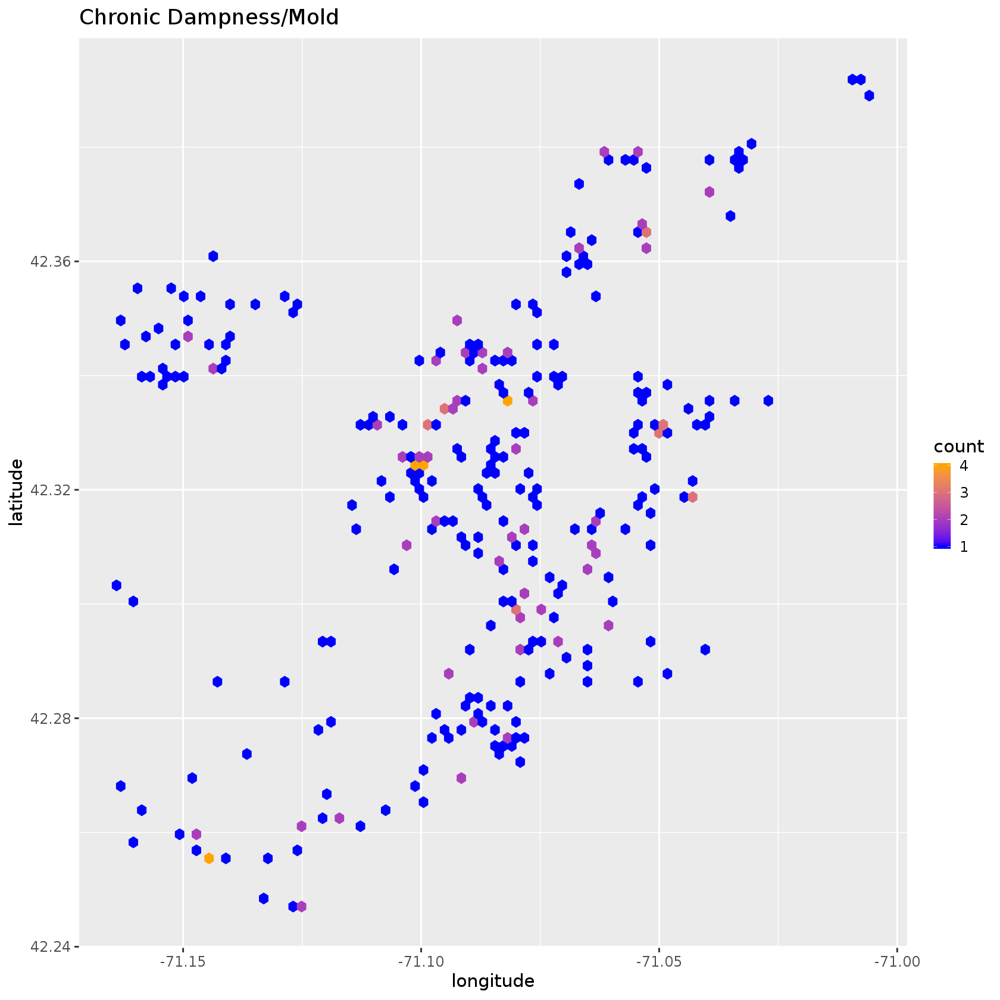

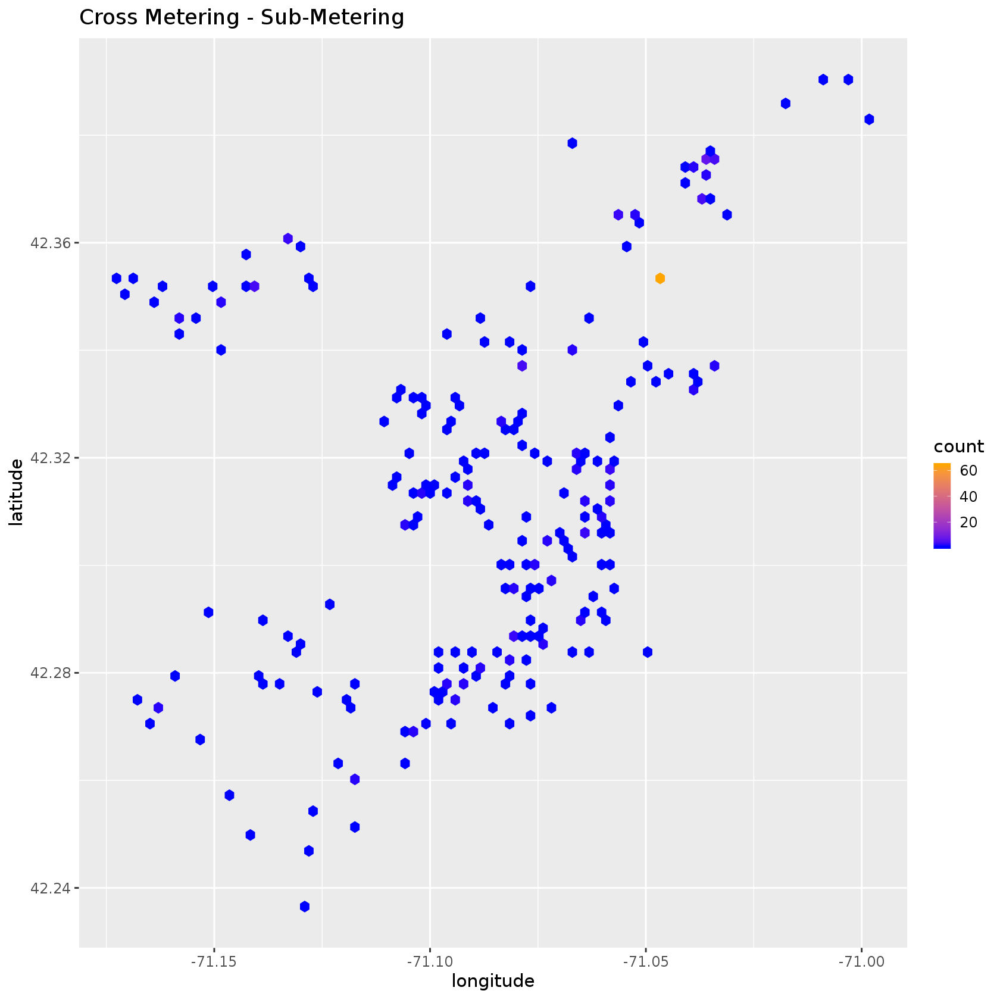

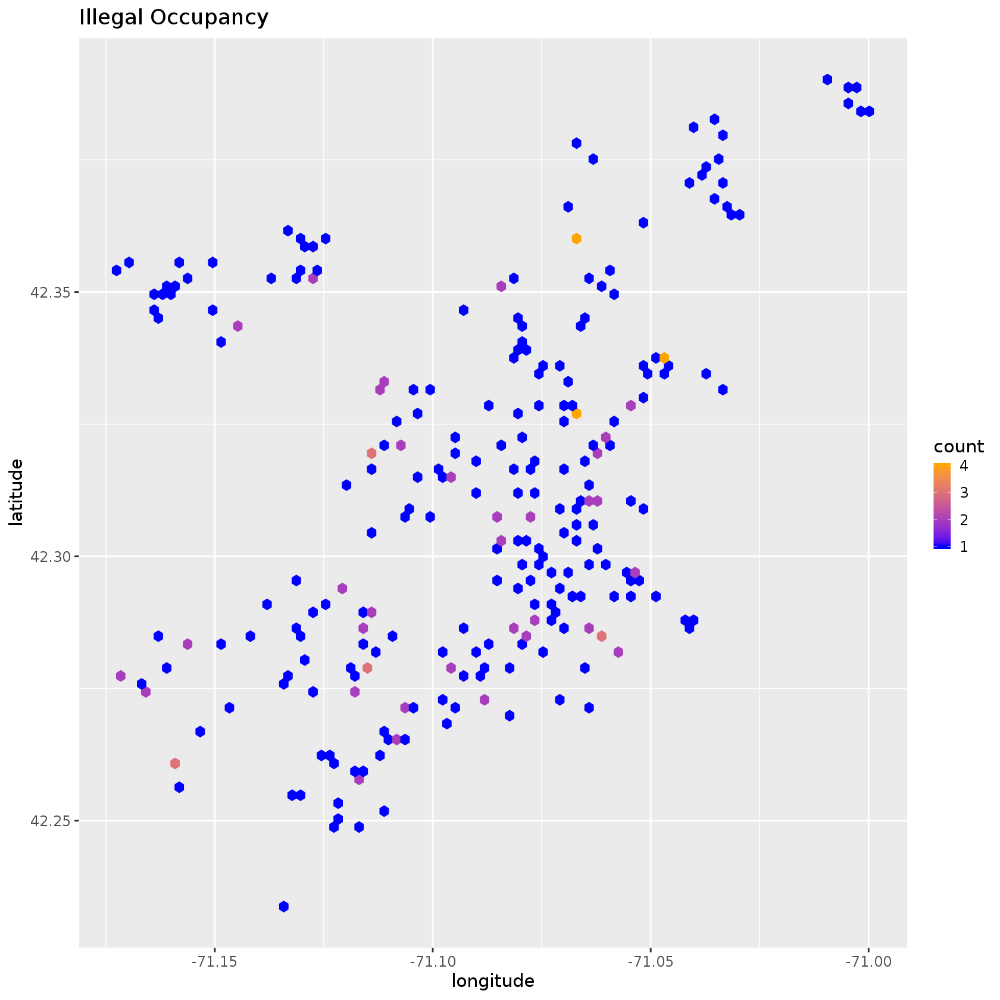

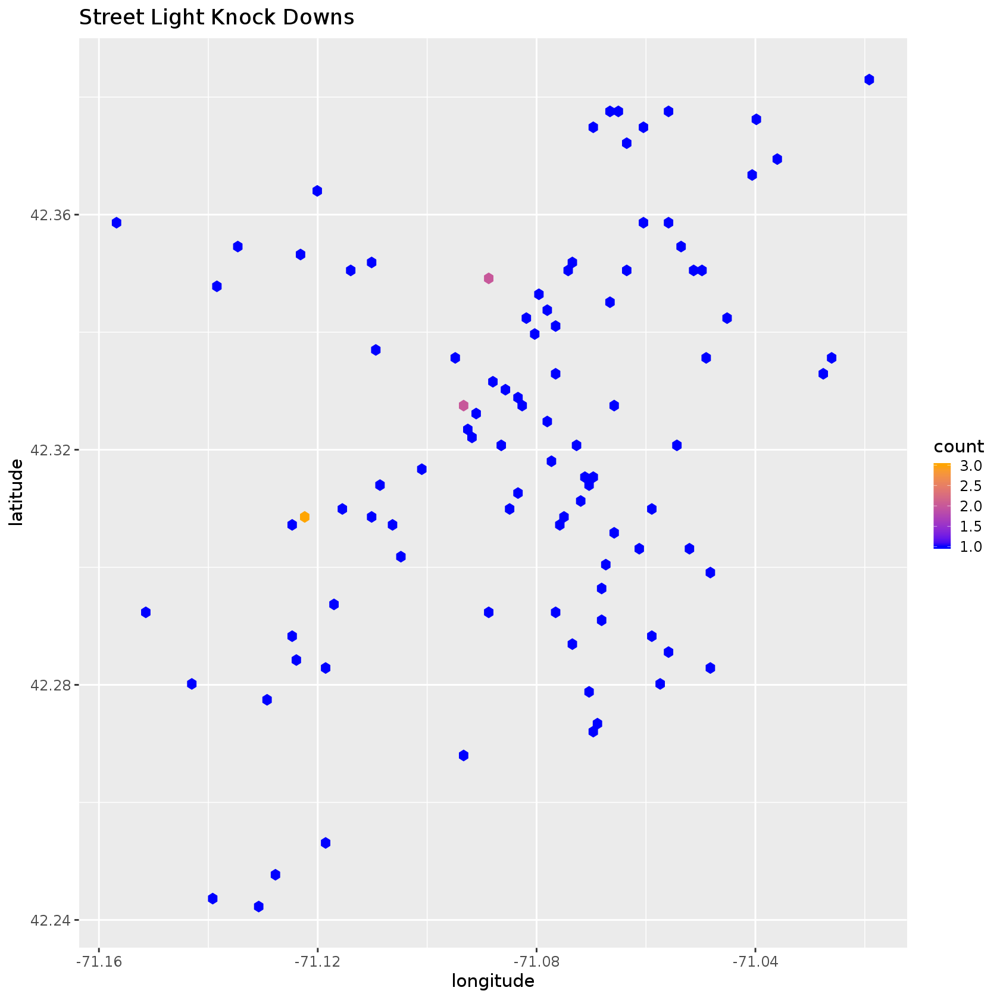

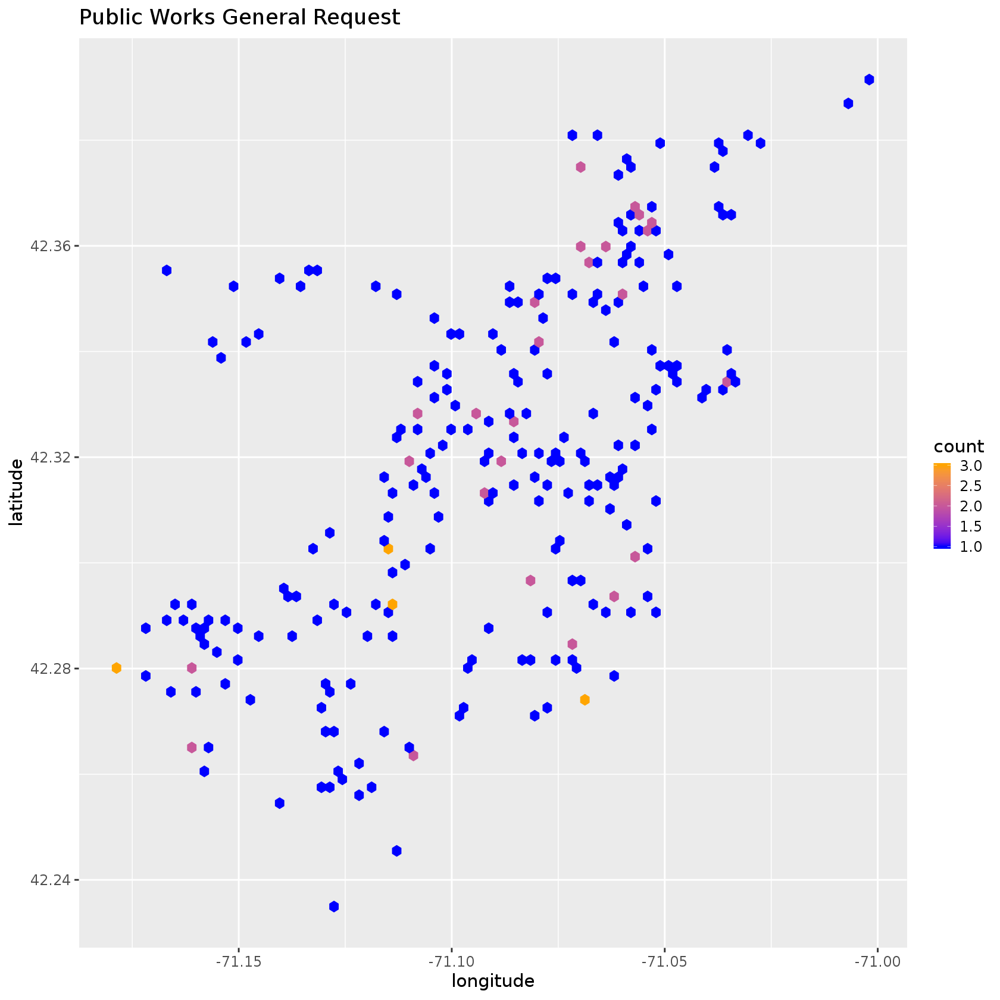

In [24]:
topTypes <- ct[order(-ct$Freq),]$type[seq(1,60)]
for(type in topTypes) {
    plotBOS(notCityHall, type)
}

# Provenance

In [25]:
devtools::session_info()

─ Session info ───────────────────────────────────────────────────────────────
 setting  value                       
 version  R version 3.5.2 (2018-12-20)
 os       Debian GNU/Linux 9 (stretch)
 system   x86_64, linux-gnu           
 ui       X11                         
 language (EN)                        
 collate  en_US.UTF-8                 
 ctype    en_US.UTF-8                 
 tz       Etc/UTC                     
 date     2020-01-13                  

─ Packages ───────────────────────────────────────────────────────────────────
 package      * version    date       lib source                            
 assertthat     0.2.1      2019-03-21 [2] CRAN (R 3.5.2)                    
 backports      1.1.5      2019-10-02 [1] CRAN (R 3.5.2)                    
 base64enc      0.1-3      2015-07-28 [2] CRAN (R 3.5.2)                    
 bit            1.1-14     2018-05-29 [2] CRAN (R 3.5.2)                    
 bit64          0.9-7      2017-05-08 [2] CRAN (R 3.5.2)          

Copyright 2018 The Broad Institute, Inc., Verily Life Sciences, LLC All rights reserved.

This software may be modified and distributed under the terms of the BSD license. See the LICENSE file for details.